In [131]:
import FalseColor_methods as fc 
from FCdataobject import DataObject
import h5py as hp
import numpy as np
import tifffile as tf
import os 
import json
import glob
import skimage.filters as filt
import cv2
import time
import skimage.morphology as morph
import skimage.feature as feat
%matplotlib notebook
import matplotlib.pyplot as plt

In [2]:
datapath = os.path.join(os.getcwd(),'h5_sample_data')
datafile = os.path.join(datapath,'data-f0.h5')

testData = DataObject(directory=datapath)

In [3]:
testData.setupH5data(folder=datapath)

['__DATA_TYPES__', 's00', 's01', 't00000']
(1025, 717, 1025, 2)


In [4]:
channelIDs = ['s00', 's01']

In [5]:
colorSingle_runnable = {'runnable' : fc.singleChannel_falseColor}
falseColor_runnable = {'runnable' : fc.falseColor, 'kwargs' : {'channelIDs':channelIDs}}
preprocess_runnable = {'runnable' : fc.preProcess, 'kwargs' : None}
combine_runnable = {'runnable' : fc.combineFalseColoredChannels, 'args' : None}
adaptive_runnable = {'runnable' : fc.adaptiveBinary, 'kwargs': {'blocksize':300}}

In [6]:
trial_set = testData.imageSet[:40]

In [7]:
t0 = time.time()
combined_false_colored_data = testData.processImages(falseColor_runnable,imageSet=testData.imageSet)
print(time.time()-t0)

/Users/robertserafin/Desktop/Image_analysis_codebase/False Coloring/FalseColor_methods.py:172: RuntimeWarning: invalid value encountered in power
  images = numpy.power(images,0.85)
/Users/robertserafin/Desktop/Image_analysis_codebase/False Coloring/FalseColor_methods.py:176: RuntimeWarning: invalid value encountered in greater
  image_mean = numpy.mean(images[images>thresh])*8
/Users/robertserafin/Desktop/Image_analysis_codebase/False Coloring/FalseColor_methods.py:180: RuntimeWarning: invalid value encountered in less
  processed_images[processed_images < 0] = 0
/Users/robertserafin/Desktop/Image_analysis_codebase/False Coloring/FalseColor_methods.py:172: RuntimeWarning: invalid value encountered in power
  images = numpy.power(images,0.85)
/Users/robertserafin/Desktop/Image_analysis_codebase/False Coloring/FalseColor_methods.py:176: RuntimeWarning: invalid value encountered in greater
  image_mean = numpy.mean(images[images>thresh])*8
/Users/robertserafin/Desktop/Image_analysis_code

52.159467935562134


In [ ]:
plt.close('all')
for i in range(50,55):
    f,ax = plt.subplots(ncols = 2, figsize = (9,4))
    ax[0].imshow(testData.imageSet[i,:,:,0])
    ax[0].set_title('Tile %s Nuclei'%(i),fontsize = 12)
    ax[1].imshow(testData.imageSet[i,:,:,1])
    ax[1].set_title('Tile %s Cytoplasm'%(i),fontsize = 12)
#     ax[1][0].imshow(combined_false_colored_data[0][i])
#     ax[1][0].set_title('False Coloring',fontsize = 12)
#     f.delaxes(ax[1][1])
#     f.suptitle('Tile %s' %(i))

<IPython.core.display.Javascript object>


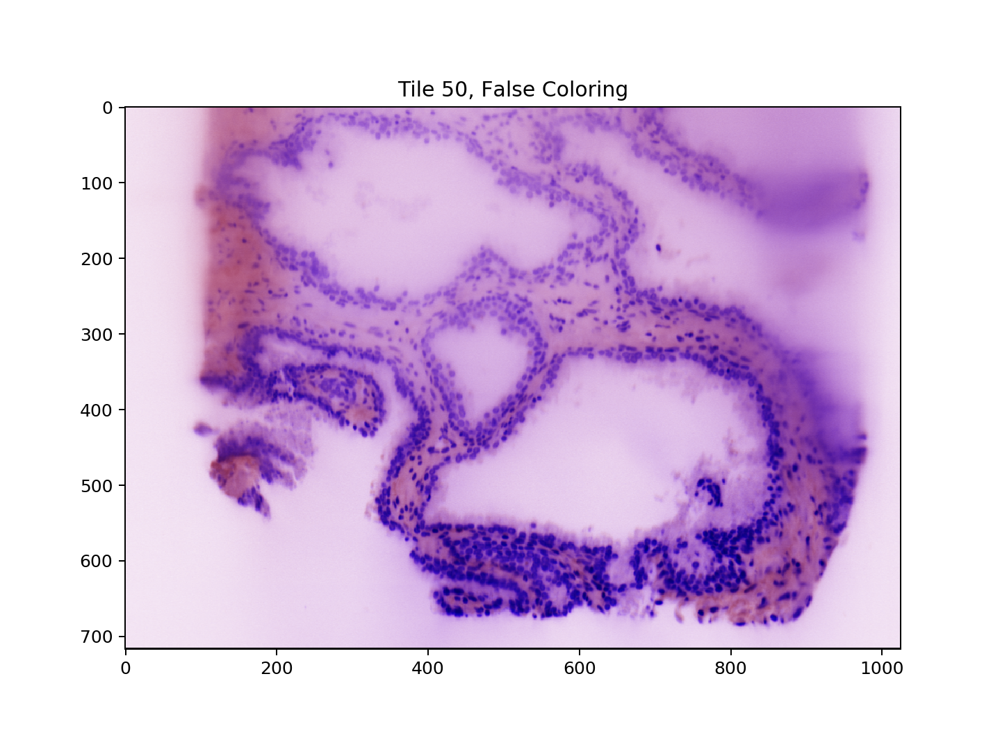

<IPython.core.display.Javascript object>


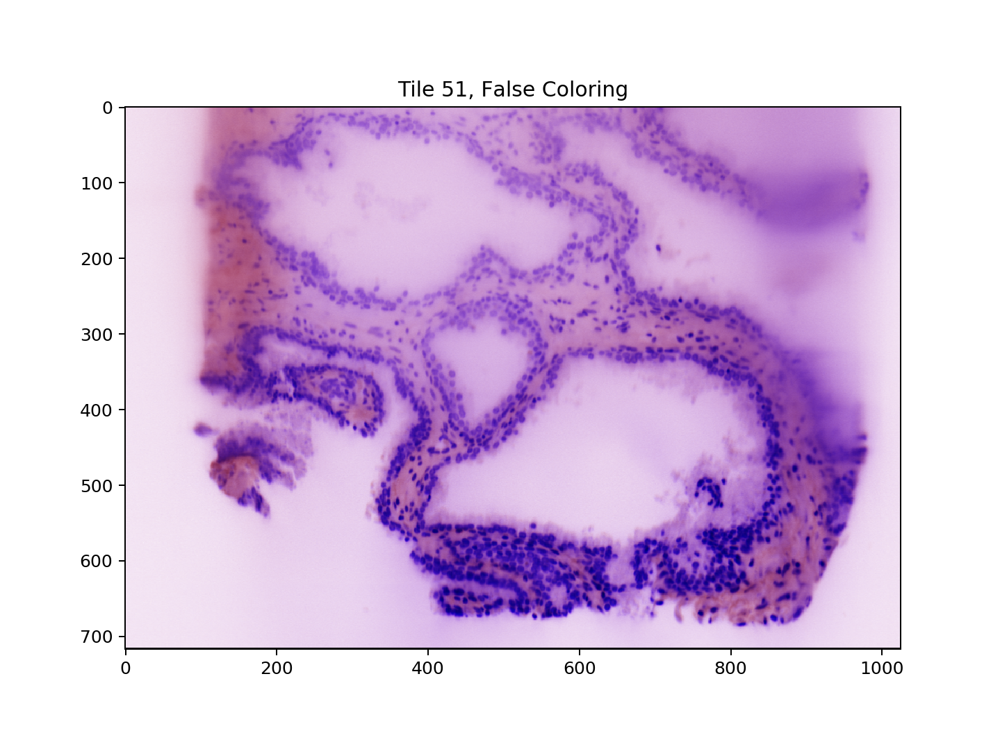

<IPython.core.display.Javascript object>


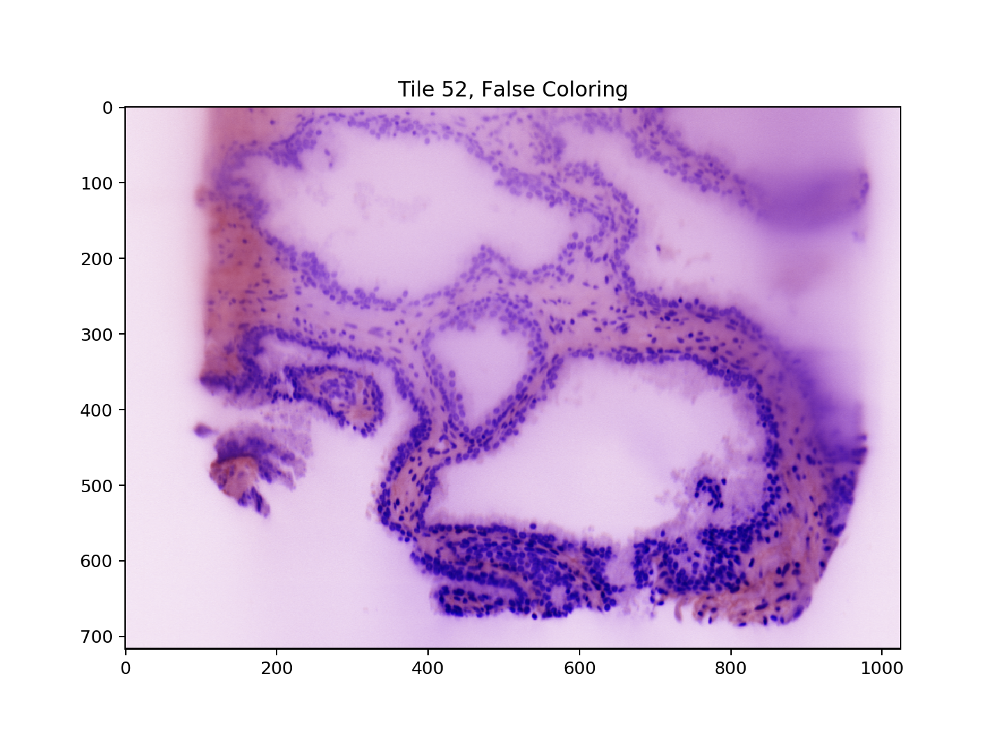

<IPython.core.display.Javascript object>


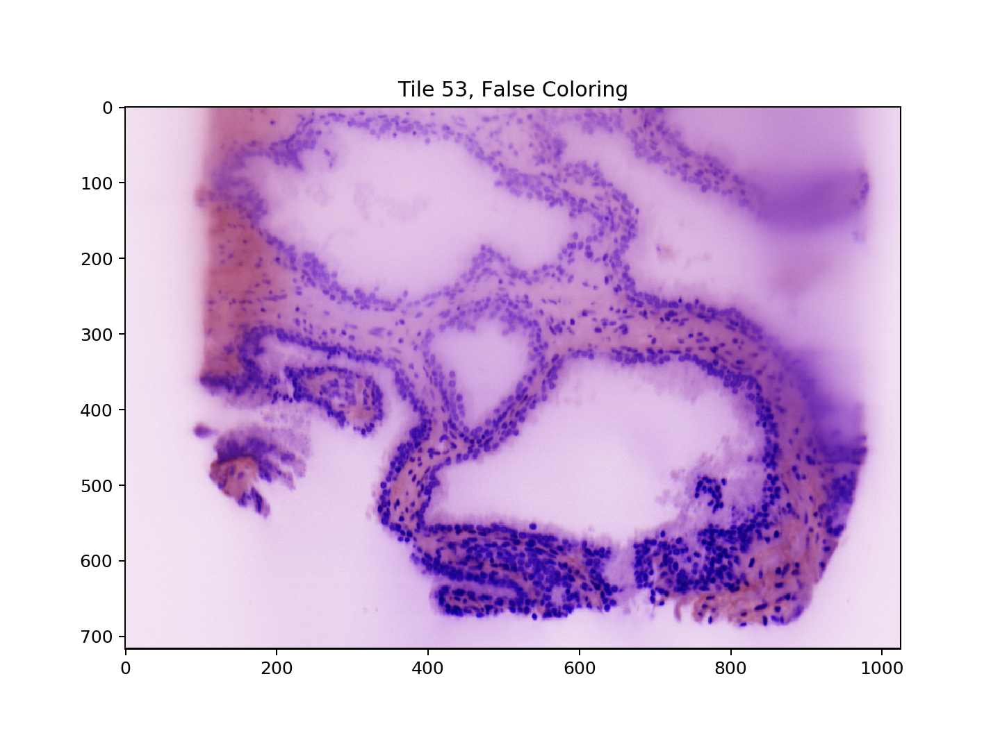

<IPython.core.display.Javascript object>


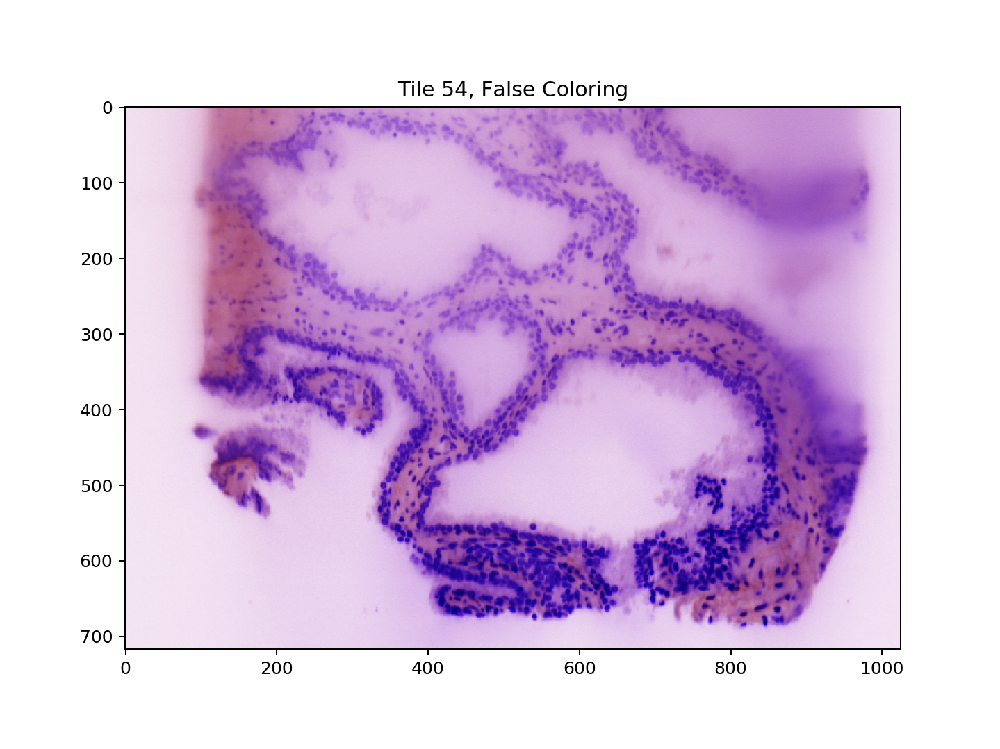

In [8]:
for i in range(50,55):
    plt.subplots(figsize = (8,6))
    plt.imshow(combined_false_colored_data[0][i])
    plt.title('Tile %s, False Coloring'%(i), fontsize = 12)

In [9]:
plt.close('all')

In [ ]:
binary_data = testData.processImages(adaptive_runnable,imageSet=trial_set)

In [7]:
import skimage.exposure as ex
import skimage.measure as me
import scipy.ndimage as nd
import skimage.segmentation as sg
import cv2

In [283]:
def ViewImage(Img,title=None):
    f,ax = plt.subplots(ncols = 2,figsize = (8,6))
    ax[0].imshow(Img)
    ax[0].set_title('Image')
    ax[1].hist(Img[Img != 0].ravel(),bins=256)
    ax[1].set_title('Histogram')
    if title is not None:
        f.suptitle(title)
    return f,ax

In [180]:
testimg = trial_set[33][:,200:800,0]
print(testimg.shape)
testimg.dtype

(717, 600)


dtype('int16')

In [ ]:
test_Clahe = execute_clahe(testimg.astype('uint16'))
ViewImage(test_Clahe)

In [268]:
def convert_8bit(img):
    return (img/256).astype('uint8')

def convert8_16bit(img):
    return (img*256).astype('uint16')

def float_2int(img,normfactor = 256,dtype = 'uint8'):
    return (img*normfactor).astype(dtype)

def execute_clahe(img):
    clahe = cv2.createCLAHE(clipLimit=8.0, tileGridSize=(8,8))
    cl1 = clahe.apply(img)
    return cl1

<IPython.core.display.Javascript object>


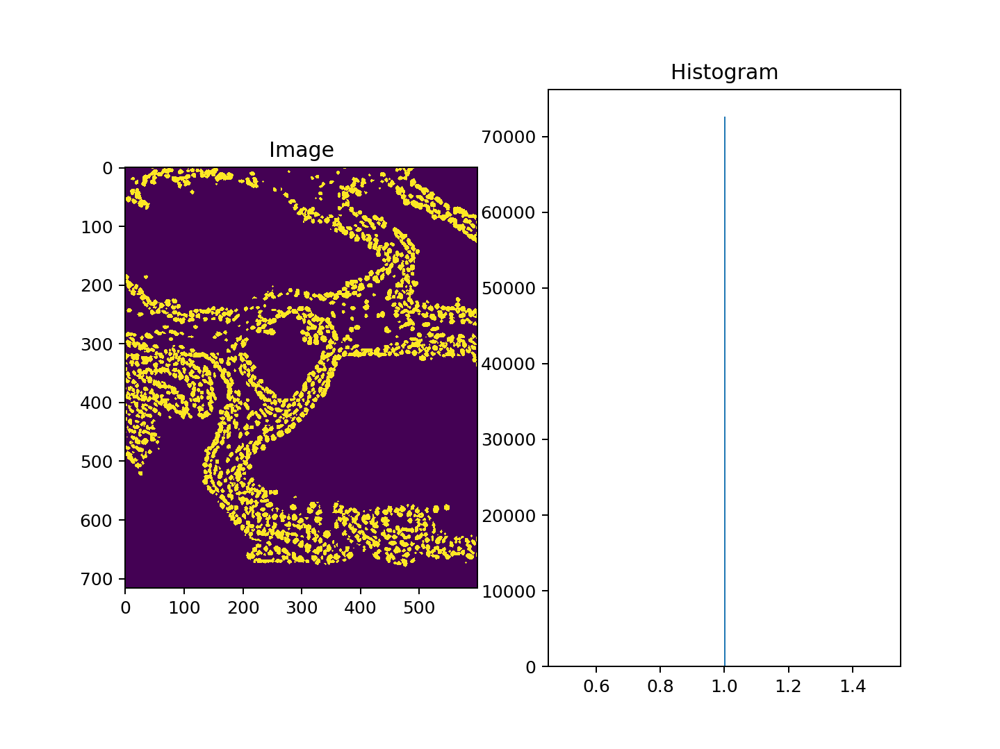

/Users/robertserafin/anaconda3/lib/python3.6/site-packages/skimage/util/dtype.py:135: UserWarning: Possible precision loss when converting from float32 to uint16
  .format(dtypeobj_in, dtypeobj_out))


<IPython.core.display.Javascript object>


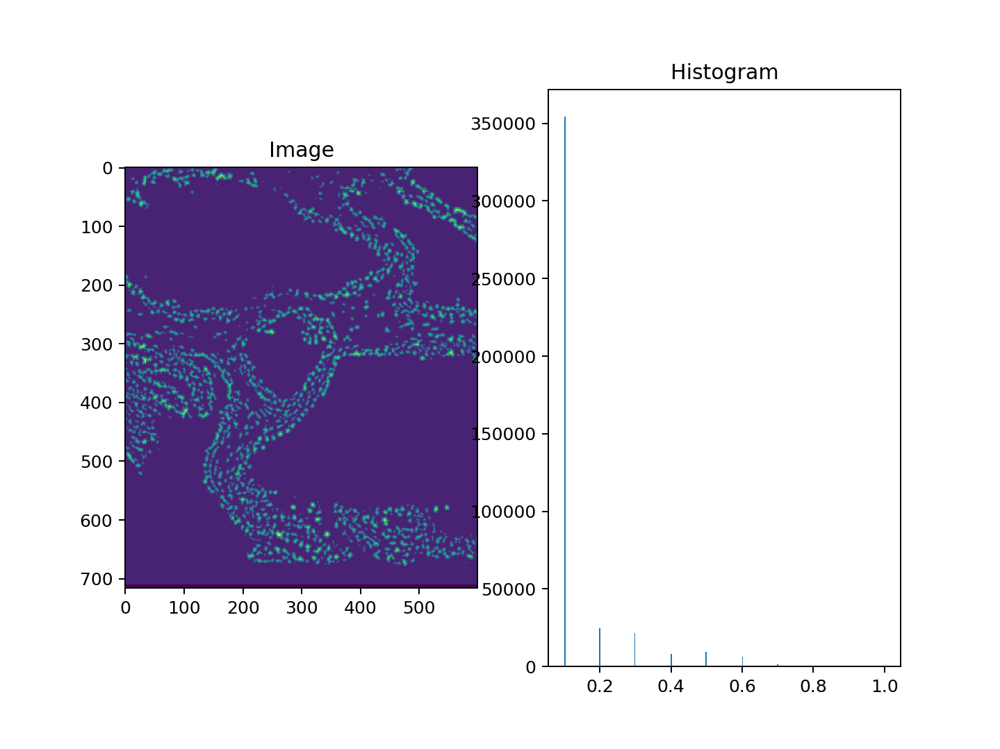

<IPython.core.display.Javascript object>


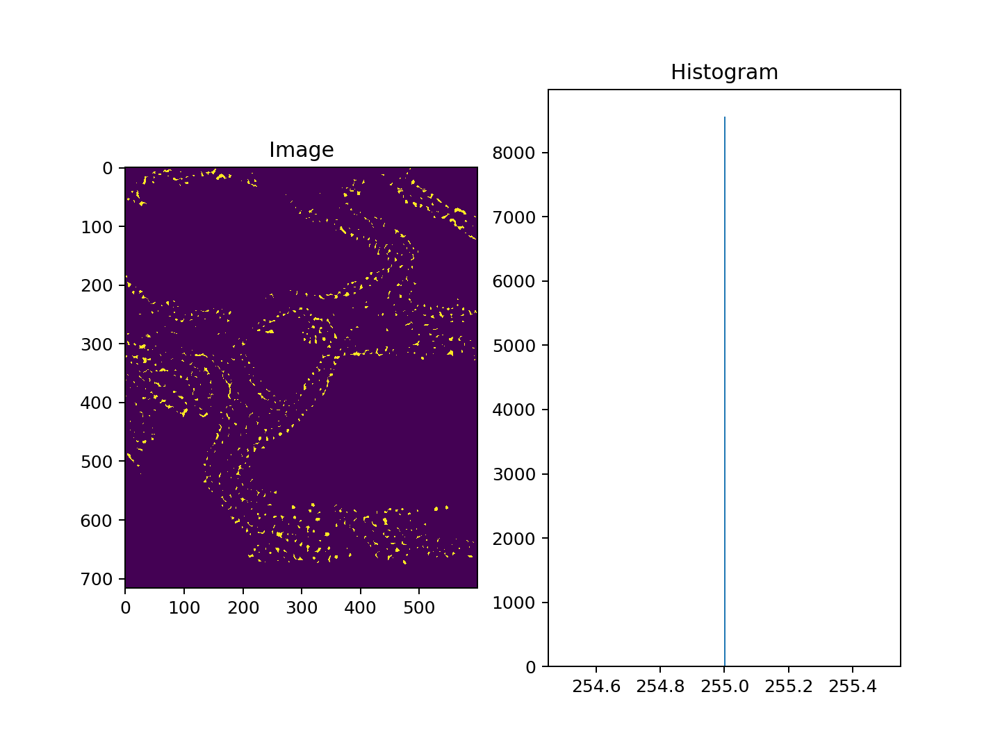

(<Figure size 800x600 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x1ccbd16400>,
       dtype=object))

In [405]:
testimg1 = convert_8bit(testimg)
img_equalized = execute_clahe(testimg1)
img_equalized[img_equalized<40]=0
img_med = cv2.medianBlur(img_equalized,5)
# ViewImage(img_med)

el = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
dilated_img = cv2.dilate(img_equalized,el)
# ViewImage(dilated_img)
# ViewImage(cv2.erode(dilated_img,el))


binary_dilated = cv2.adaptiveThreshold(dilated_img,1,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,\
                                        cv2.THRESH_BINARY,21,-3)

binary_opened = cv2.morphologyEx(binary_dilated, cv2.MORPH_OPEN, el)
ViewImage(binary_opened)

dist_trans = cv2.distanceTransform(binary_opened,cv2.DIST_L2,3)
dist_trans /= dist_trans.max()
dist_trans = ex.equalize_adapthist(dist_trans,nbins=10)

# ret,seeds = cv2.threshold(dist_trans,.5*dist_trans.max(),255,0)
ViewImage(dist_trans)
ViewImage(seeds)





<IPython.core.display.Javascript object>


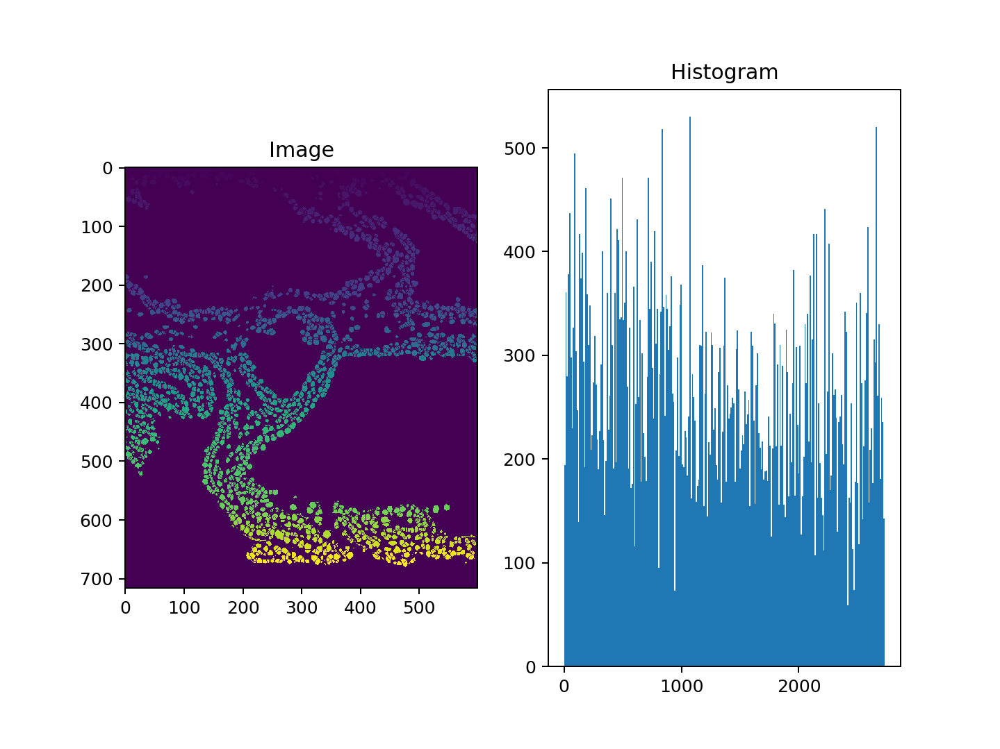

(<Figure size 800x600 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x1d8b8df940>,
       dtype=object))

In [421]:
import scipy.ndimage as ndi
distance = ndi.distance_transform_edt(binary_dilated)
local_maxi = feat.peak_local_max(distance, indices=False, footprint=np.ones((3, 3)),
                            labels=binary_dilated)
markers = ndi.label(local_maxi)[0]
labels = morph.watershed(-distance, markers, mask=binary_dilated,watershed_line=True)
ViewImage(labels)

<IPython.core.display.Javascript object>


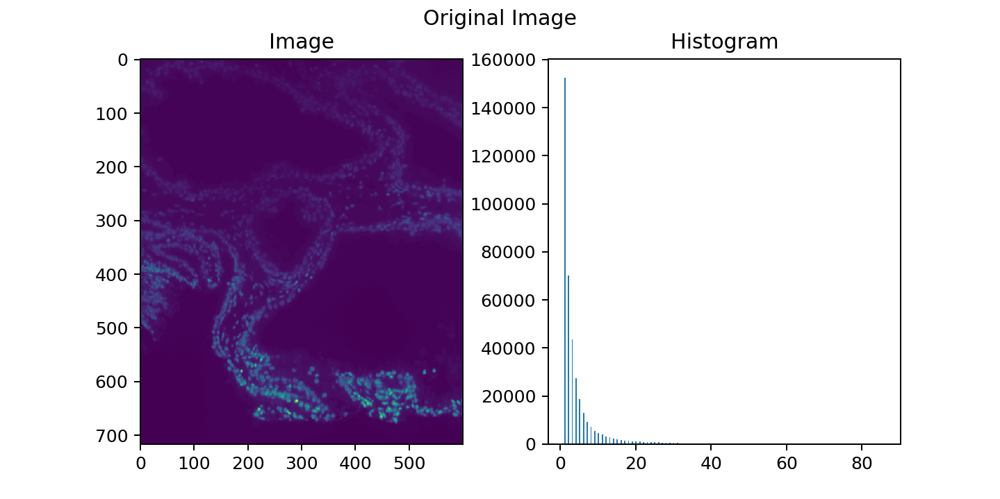

<IPython.core.display.Javascript object>


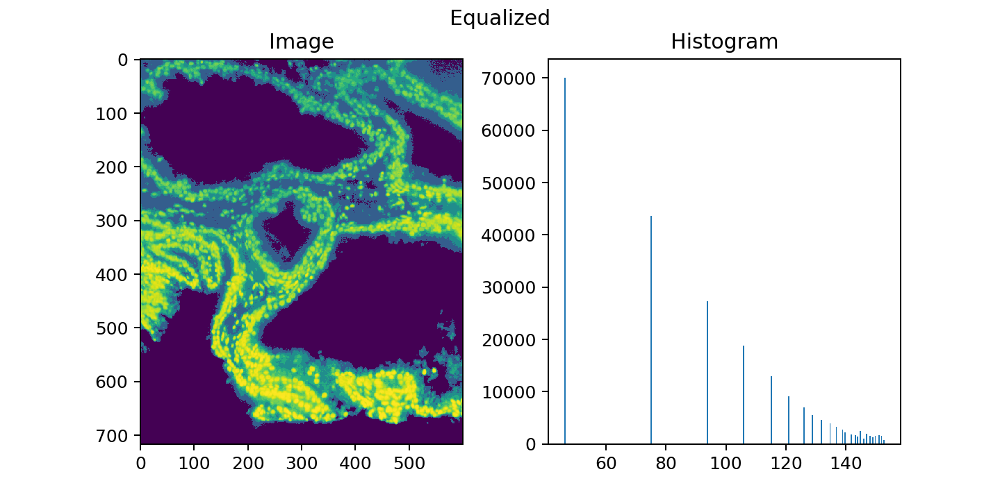

<IPython.core.display.Javascript object>


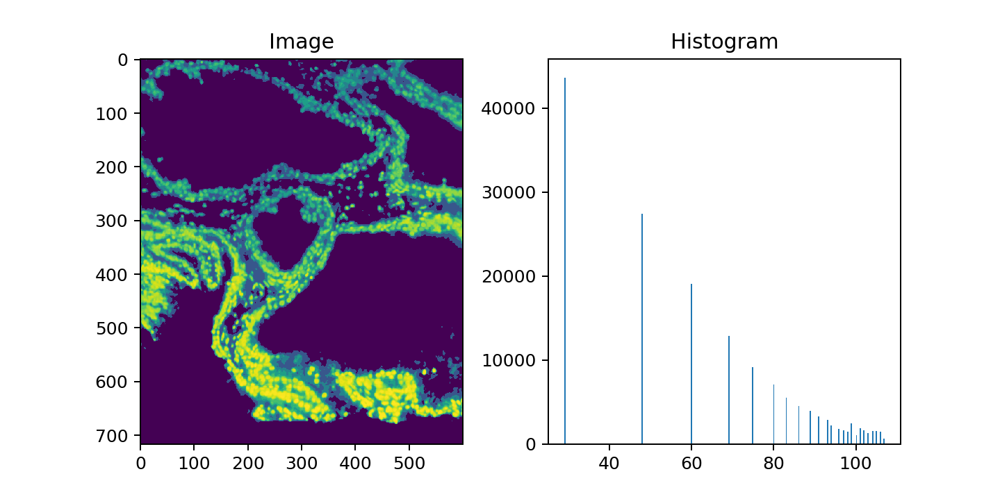

<IPython.core.display.Javascript object>


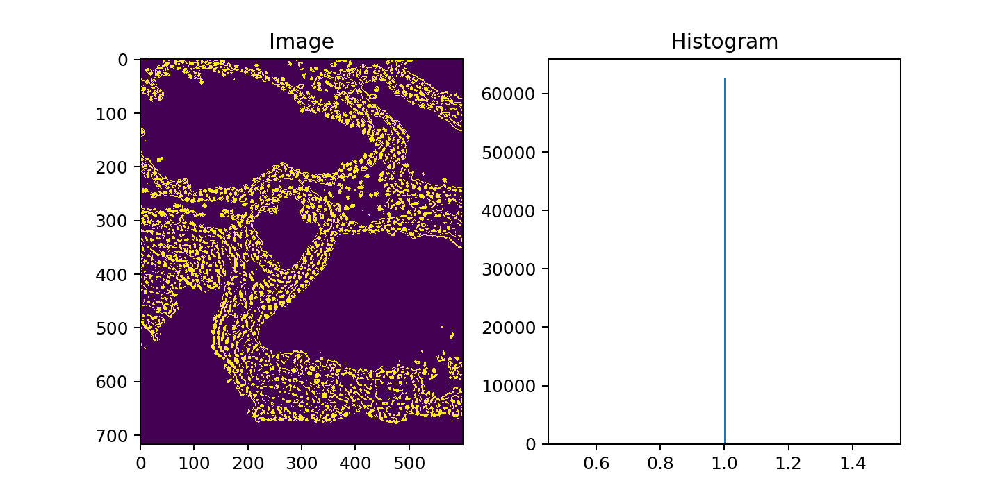

/Users/robertserafin/anaconda3/lib/python3.6/site-packages/skimage/morphology/misc.py:208: UserWarning: Any labeled images will be returned as a boolean array. Did you mean to use a boolean array?
  "Did you mean to use a boolean array?", UserWarning)


<IPython.core.display.Javascript object>


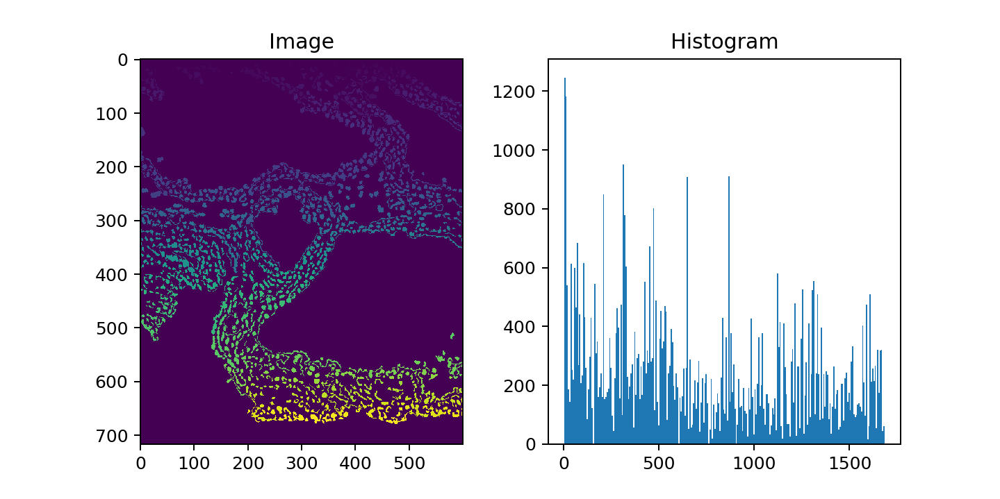

(<Figure size 800x400 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x1c89e8e198>,
       dtype=object))

In [251]:
from scipy.stats import mode

testimg1 = convert_8bit(testimg)
ViewImage(testimg1,'Original Image')
# testimg1 = ex.equalize_adapthist(testimg1,nbins=512)
testimg1 = cv2.equalizeHist(testimg1)
testimg1[testimg1 >0] -= mode(testimg1,axis=None)[0]
ViewImage(testimg1,'Equalized')
median_img = cv2.medianBlur(testimg1,3)
median_img[median_img>0] -= mode(median_img[median_img>0],axis=None)[0]
kernal = np.ones((1,1)).astype('uint8')
median_img = cv2.erode(median_img,kernal)
ViewImage(median_img)

median_threshed = cv2.adaptiveThreshold(median_img,1,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,\
                                        cv2.THRESH_BINARY,11,-3)



ViewImage(median_threshed)
labeled_median = label_remove(median_threshed)
ViewImage(labeled_median)

In [252]:
plt.close('all')

In [50]:
cv2.ADAPTIVE_THRESH_GAUSSIAN_C?

/Users/robertserafin/anaconda3/lib/python3.6/site-packages/skimage/util/dtype.py:131: UserWarning: Possible sign loss when converting negative image of type int16 to positive image of type uint16.
  .format(dtypeobj_in, dtypeobj_out))
/Users/robertserafin/anaconda3/lib/python3.6/site-packages/skimage/util/dtype.py:135: UserWarning: Possible precision loss when converting from int16 to uint16
  .format(dtypeobj_in, dtypeobj_out))


<IPython.core.display.Javascript object>


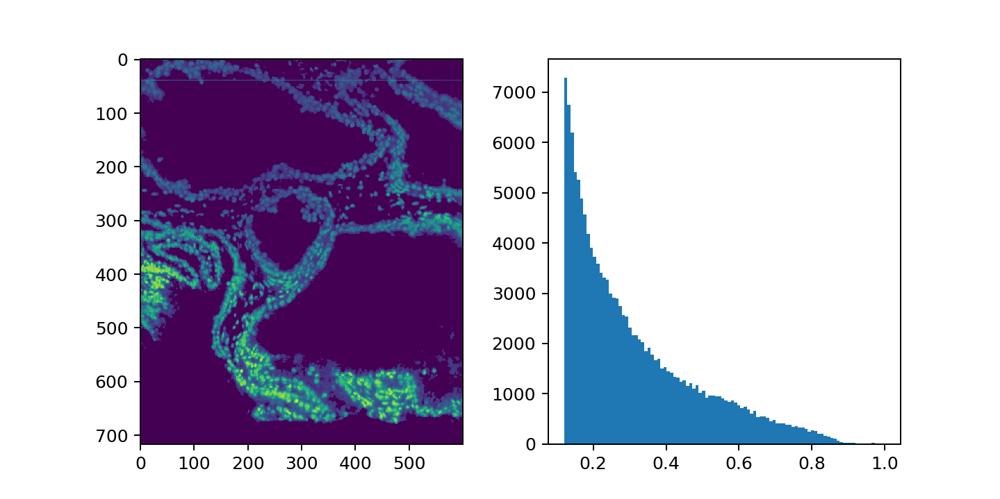

<IPython.core.display.Javascript object>


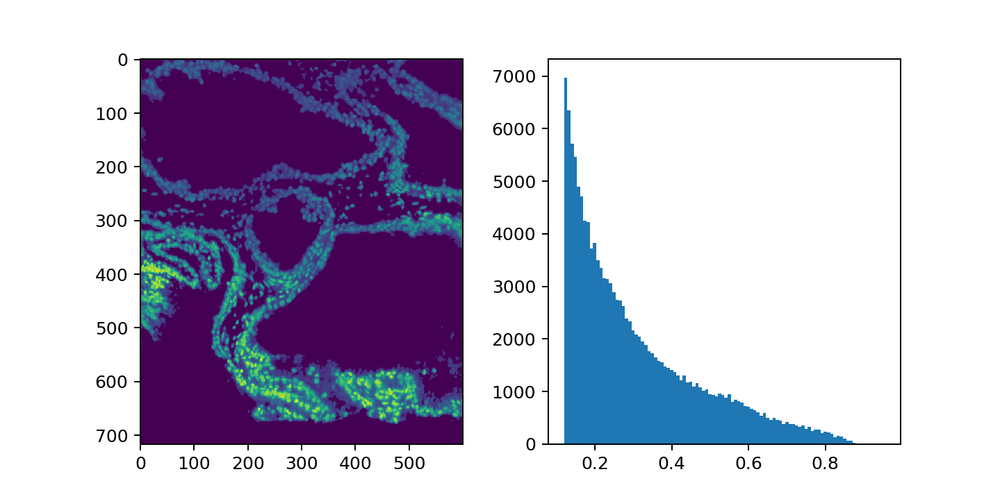

<IPython.core.display.Javascript object>


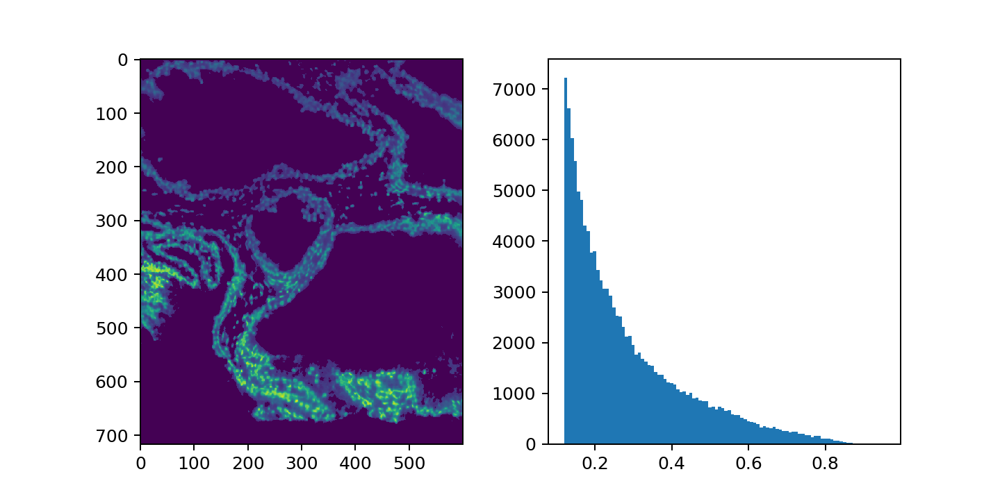

<IPython.core.display.Javascript object>


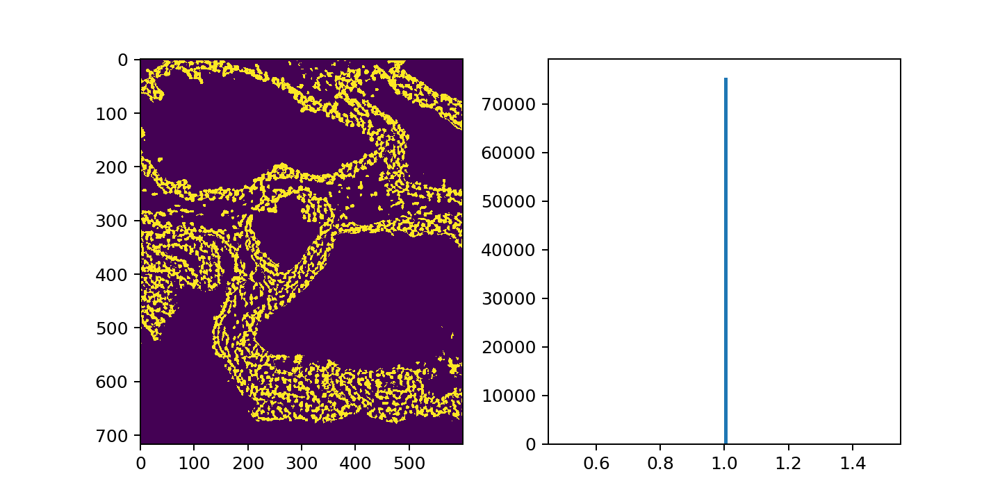

<IPython.core.display.Javascript object>


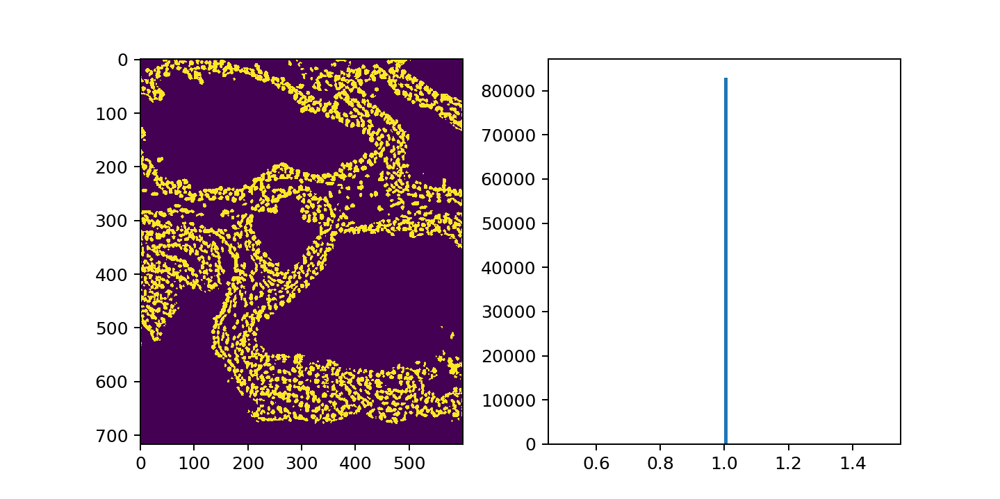

<IPython.core.display.Javascript object>


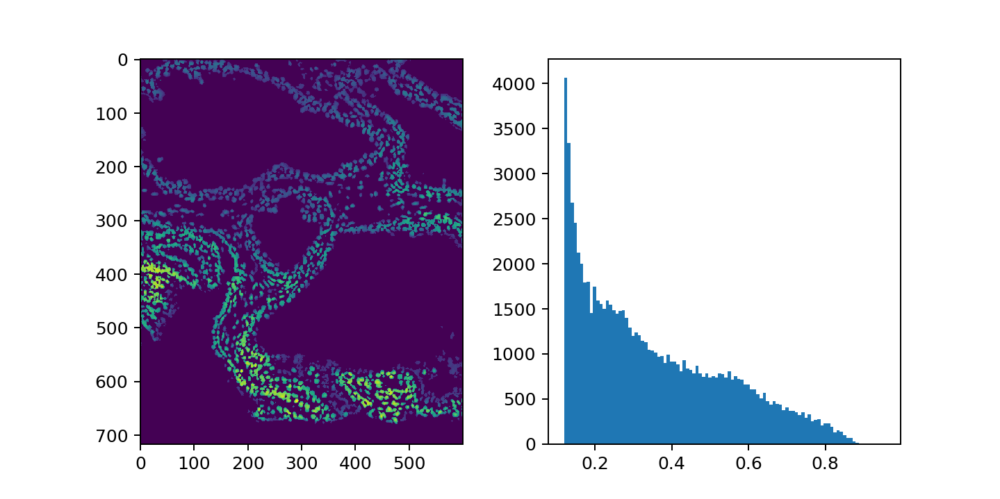

/Users/robertserafin/anaconda3/lib/python3.6/site-packages/skimage/util/dtype.py:135: UserWarning: Possible precision loss when converting from float64 to uint8
  .format(dtypeobj_in, dtypeobj_out))


<IPython.core.display.Javascript object>


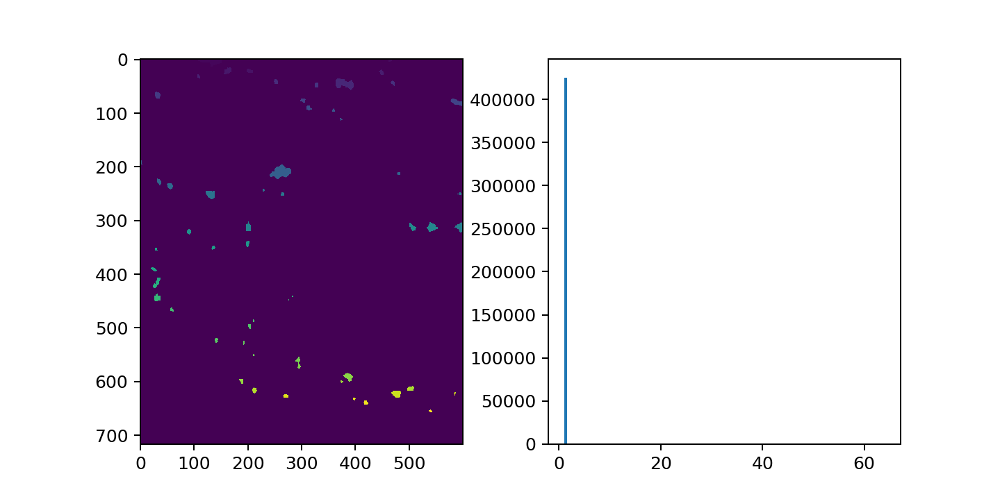

(<Figure size 800x400 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x1c2f034358>,
       dtype=object))

In [117]:
testimg1 = ex.equalize_adapthist(testimg,nbins = 512)
testimg1[testimg1<.12] = 0

ViewImage(testimg1)

opened = morph.opening(testimg1)
ViewImage(opened)

eroded = morph.erosion(testimg1)
ViewImage(eroded)

bin_eroded = eroded > filt.threshold_local(eroded,block_size=21)
ViewImage(bin_eroded.astype(int))

bin_open = opened > filt.threshold_local(opened,block_size = 21)
bin_open = morph.binary_opening(bin_open)
ViewImage(bin_open)

ViewImage(opened*bin_open)

ViewImage(sg.watershed(filt.median(opened*bin_open)))



<IPython.core.display.Javascript object>


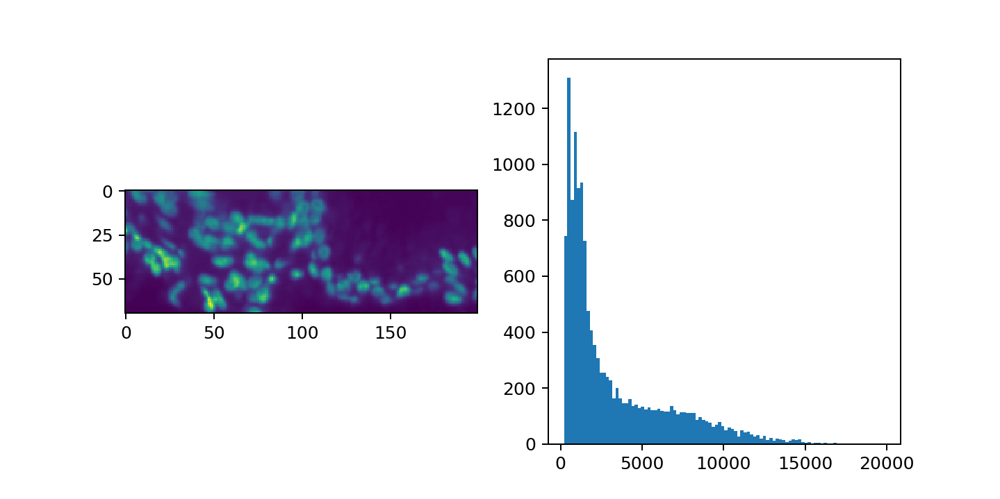

(70, 200)
(14000, 14000)
(14000, 14000)


In [138]:
from sklearn.feature_extraction import image
from sklearn.cluster import spectral_clustering

test = testimg[600:670,400:600]
ViewImage(test)
mask = bin_open[600:670,400:600]
print(test.shape)
graph = image.img_to_graph(test)
print(graph.shape)
graph.data = np.exp(-graph.data / graph.data.std())

# Force the solver to be arpack, since amg is numerically
# unstable on this example
print(graph.shape)
labels = spectral_clustering(graph, n_clusters=1, eigen_solver='arpack')
# label_im = np.full(test.shape, -1.)
# label_im[test] = labels
# ViewImage(label_im)


In [139]:
labels.shape

(14000,)

In [108]:
plt.close('all')

In [245]:
def label_remove(binary_img):
    binary_img = morph.remove_small_holes(binary_img)
#     binary_img = morph.binary_opening(binary_img)
    
    newimg = morph.label(binary_img)
    
    newimg = morph.remove_small_objects(newimg,15)
    return newimg

plt.close('all')

/Users/robertserafin/anaconda3/lib/python3.6/site-packages/skimage/util/dtype.py:131: UserWarning: Possible sign loss when converting negative image of type int16 to positive image of type uint8.
  .format(dtypeobj_in, dtypeobj_out))
/Users/robertserafin/anaconda3/lib/python3.6/site-packages/skimage/util/dtype.py:135: UserWarning: Possible precision loss when converting from int16 to uint8
  .format(dtypeobj_in, dtypeobj_out))


<IPython.core.display.Javascript object>


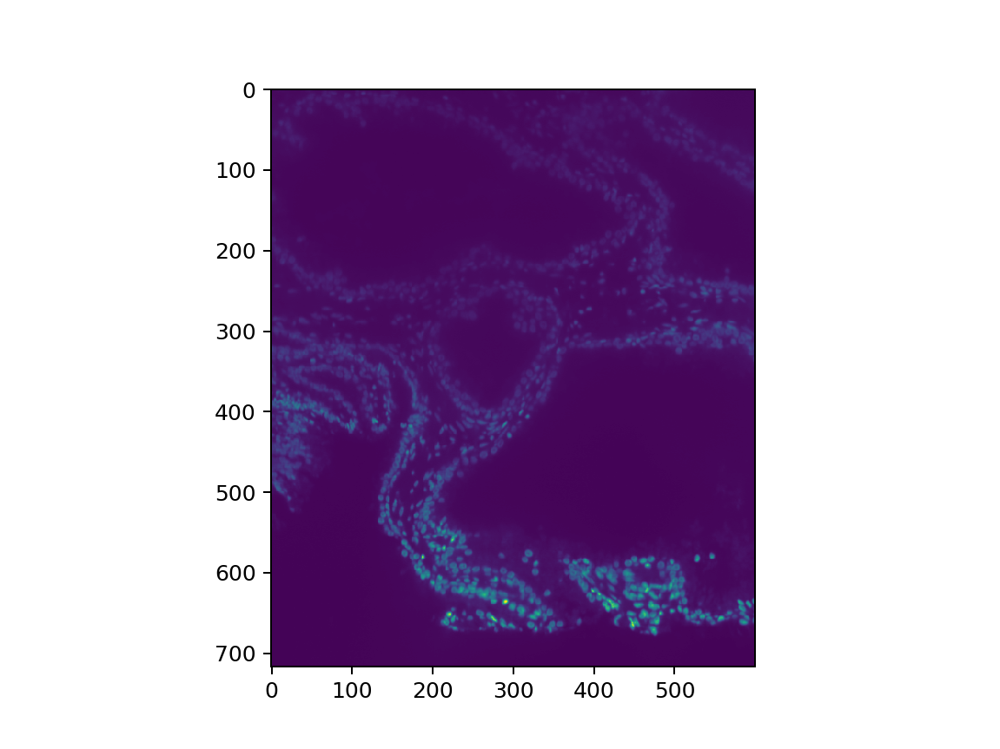

/Users/robertserafin/anaconda3/lib/python3.6/site-packages/skimage/util/dtype.py:131: UserWarning: Possible sign loss when converting negative image of type int16 to positive image of type uint16.
  .format(dtypeobj_in, dtypeobj_out))
/Users/robertserafin/anaconda3/lib/python3.6/site-packages/skimage/util/dtype.py:135: UserWarning: Possible precision loss when converting from int16 to uint16
  .format(dtypeobj_in, dtypeobj_out))


<IPython.core.display.Javascript object>


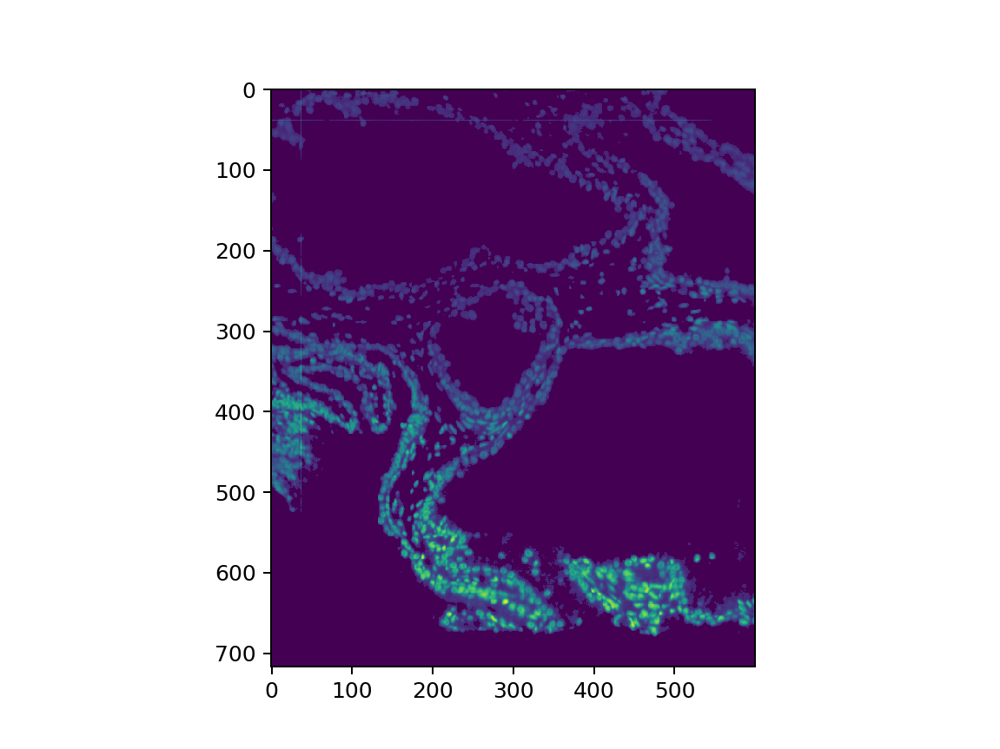

/Users/robertserafin/anaconda3/lib/python3.6/site-packages/skimage/util/dtype.py:135: UserWarning: Possible precision loss when converting from float64 to uint16
  .format(dtypeobj_in, dtypeobj_out))


<IPython.core.display.Javascript object>


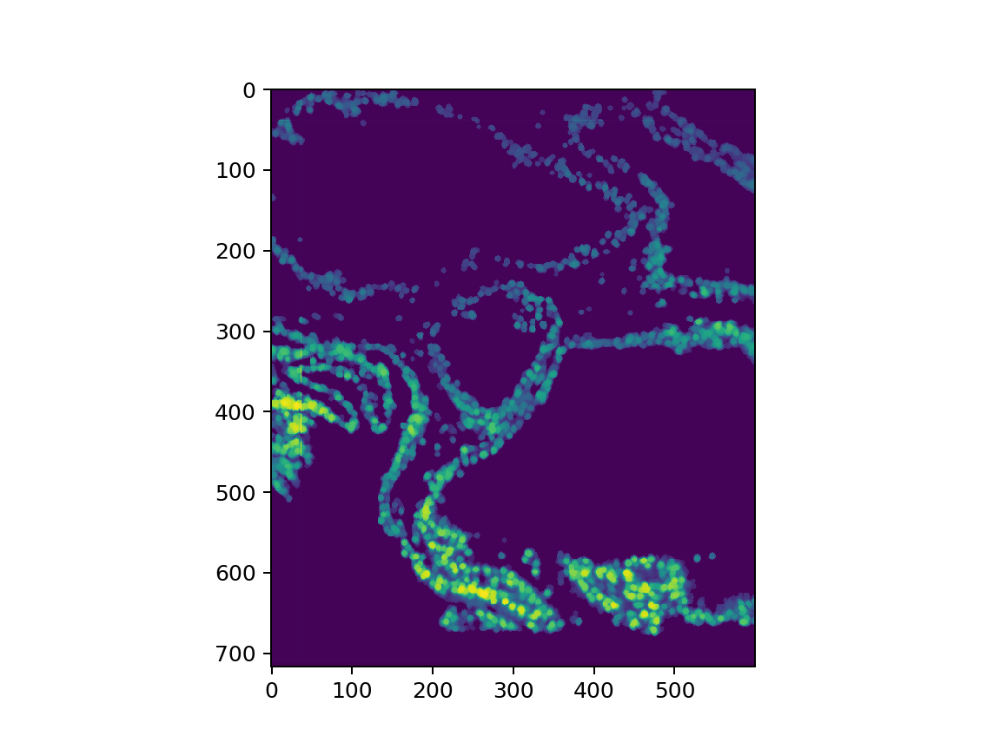

<IPython.core.display.Javascript object>


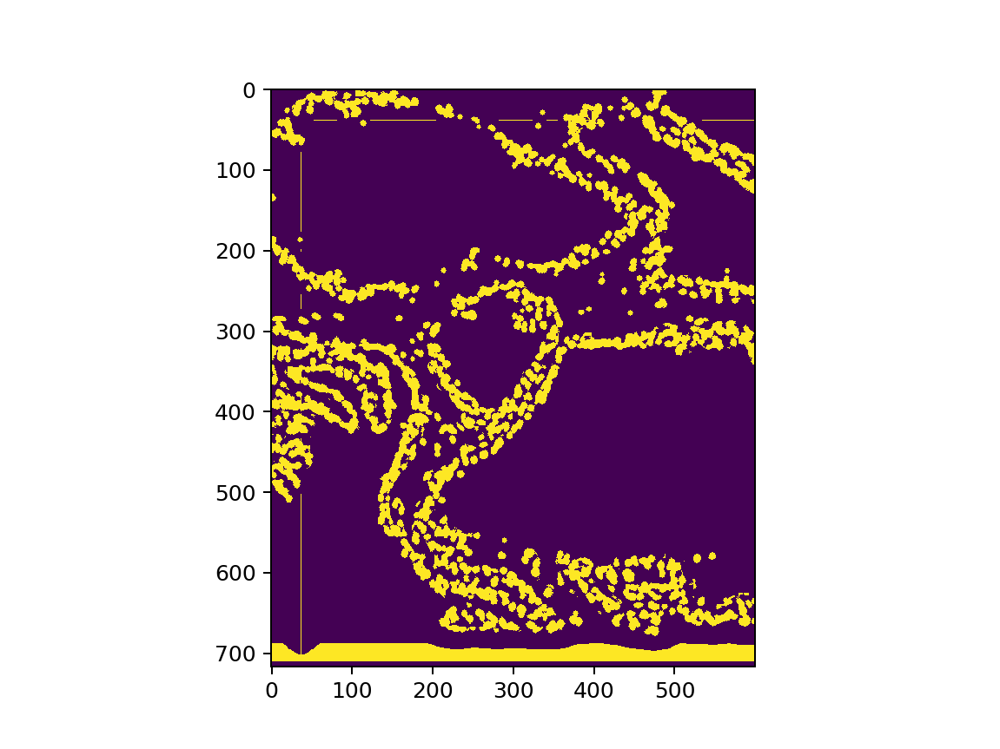

In [48]:
plt.close('all')
med_filt = filt.median(testimg)

plt.subplots()
plt.imshow(testimg - med_filt)

test_equal = ex.equalize_adapthist(testimg - med_filt)
test_equal[test_equal<.1] = 0
plt.subplots()
plt.imshow(test_equal)

equal_opened = morph.opening(test_equal,selem=morph.disk(3))
equal_opened = ex.equalize_adapthist(equal_opened,nbins=1024)

plt.subplots()
plt.imshow(equal_opened)

bin_open = equal_opened > filt.threshold_local(equal_opened,block_size=35)
plt.subplots()
plt.imshow(bin_open)

<IPython.core.display.Javascript object>


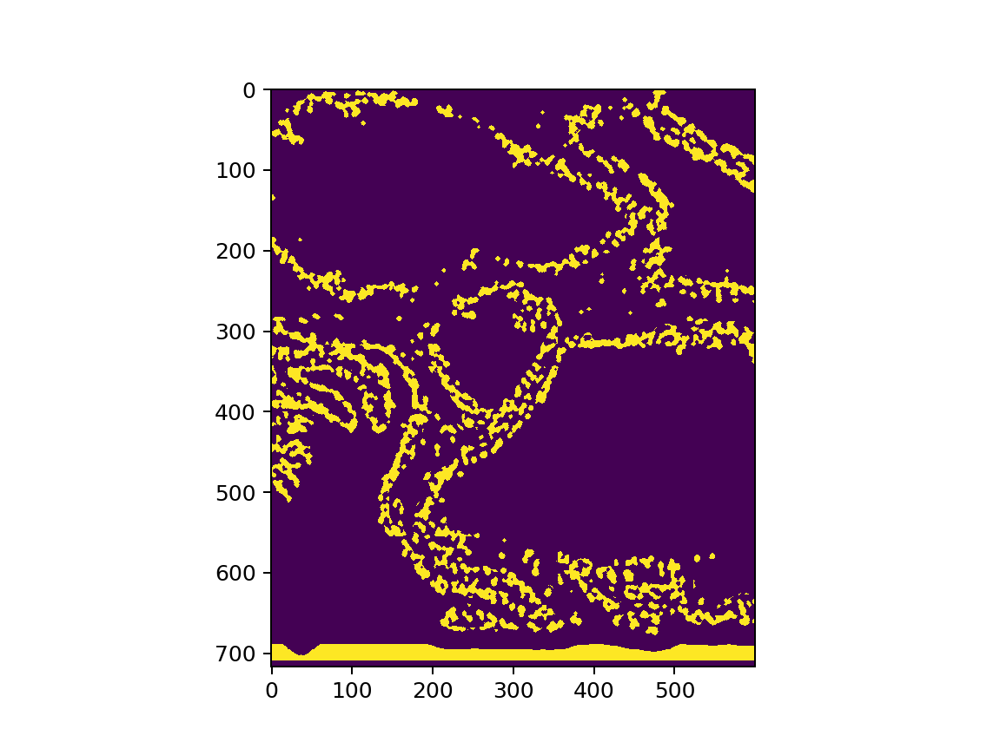

<IPython.core.display.Javascript object>


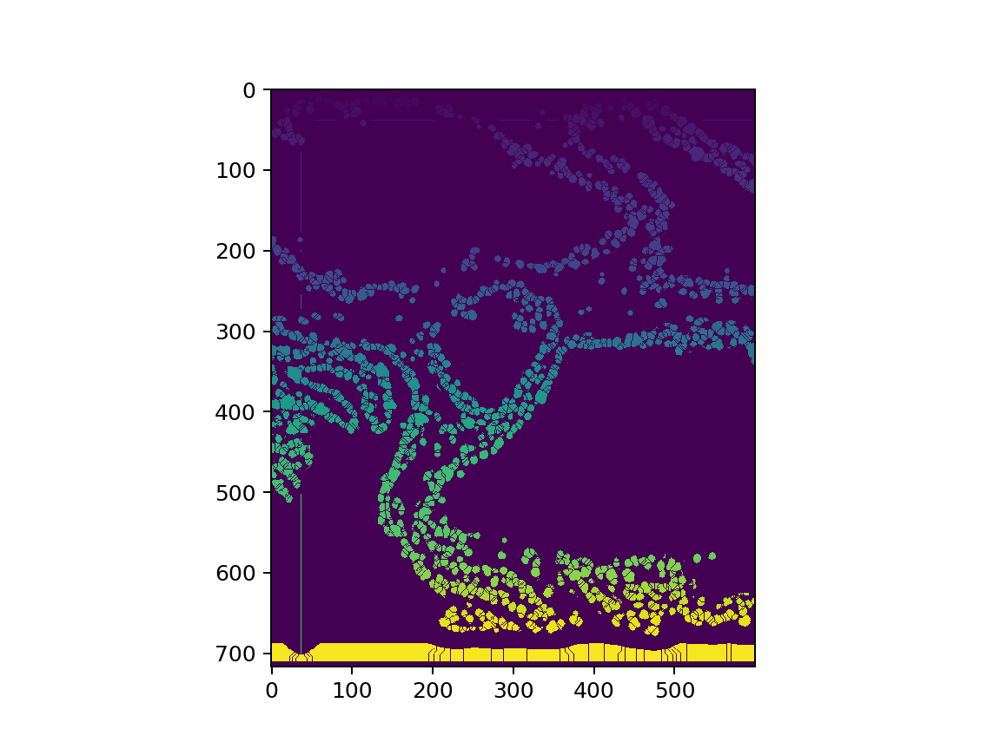

In [55]:
from scipy import ndimage


plt.subplots()
plt.imshow(morph.binary_erosion(bin_open))

distance = ndimage.distance_transform_edt(bin_open)
local_maxi = feat.peak_local_max(
    distance, indices=False, footprint=np.ones((3, 3)), labels=bin_open)
markers = ndimage.label(local_maxi)[0]
labels = morph.watershed(-distance, markers, mask=bin_open,watershed_line=True)

plt.subplots()
plt.imshow(labels)

In [37]:
linear_timeset = []
for j in range(10):
    print('On set: ',j)
    t = time.time()
    for i in range(len(testData.imageSet)):
        if (i % 100) == 0:
            print(i)
        fc.falseColor(testData.imageSet[i],channel_IDs)
    linear_timeset.append(time.time() - t)

On set:  0
0


/Users/robertserafin/Desktop/Image_analysis_codebase/False Coloring/FalseColor_methods.py:171: RuntimeWarning: invalid value encountered in power
  images = numpy.power(images,0.85)
/Users/robertserafin/Desktop/Image_analysis_codebase/False Coloring/FalseColor_methods.py:175: RuntimeWarning: invalid value encountered in greater
  image_mean = numpy.mean(images[images>thresh])*8
/Users/robertserafin/Desktop/Image_analysis_codebase/False Coloring/FalseColor_methods.py:179: RuntimeWarning: invalid value encountered in less
  processed_images[processed_images < 0] = 0


100
200
300
400
500
600
700
800
900
1000
On set:  1
0
100
200
300
400
500
600
700
800
900
1000
On set:  2
0
100
200
300
400
500
600
700
800
900
1000
On set:  3
0
100
200
300
400
500
600
700
800
900
1000
On set:  4
0
100
200
300
400
500
600
700
800
900
1000
On set:  5
0
100
200
300
400
500
600
700
800
900
1000
On set:  6
0
100
200
300
400
500
600
700
800
900
1000
On set:  7
0
100
200
300
400
500
600
700
800
900
1000
On set:  8
0
100
200
300
400
500
600
700
800
900
1000
On set:  9
0
100
200
300
400
500
600
700
800
900
1000


In [29]:
batch_timeset = []
for i in range(10):
    print(i)
    t0 = time.time()
    combined_false_colored_data = testData.processImages(falseColor_runnable,channel_IDs,singleSet=False,imageSet=testData.imageSet)
    batch_timeset.append(time.time()-t0)

0
1
2
3
4
5
6
7
8
9


In [30]:
import copy

batch_timeset_duplicate = copy.deepcopy(batch_timeset)
print(batch_timeset_duplicate)

[59.47043299674988, 52.01245307922363, 49.04718828201294, 49.74736309051514, 49.727221965789795, 51.61478805541992, 49.95790219306946, 49.001585245132446, 50.1013822555542, 48.99890995025635]


In [38]:
linear_timeset_duplicate = copy.deepcopy(linear_timeset)
print(linear_timeset_duplicate)

[90.1305742263794, 87.23316216468811, 84.08562207221985, 81.38473105430603, 79.31263327598572, 78.34552383422852, 74.36614680290222, 72.15193295478821, 70.83032202720642, 68.37054300308228]


In [32]:
testData.imageSet.shape

(1025, 717, 1025, 2)

In [35]:
testimg = fc.falseColor(testData.imageSet[0],channel_IDs)
testimg.shape

/Users/robertserafin/Desktop/Image_analysis_codebase/False Coloring/FalseColor_methods.py:171: RuntimeWarning: invalid value encountered in power
  images = numpy.power(images,0.85)
/Users/robertserafin/Desktop/Image_analysis_codebase/False Coloring/FalseColor_methods.py:175: RuntimeWarning: invalid value encountered in greater
  image_mean = numpy.mean(images[images>thresh])*8
/Users/robertserafin/Desktop/Image_analysis_codebase/False Coloring/FalseColor_methods.py:179: RuntimeWarning: invalid value encountered in less
  processed_images[processed_images < 0] = 0


(717, 1025, 3)

In [25]:
batch_timeset_backup = [59.47043299674988, 52.01245307922363, 49.04718828201294, 49.74736309051514, 49.727221965789795, 51.61478805541992, 49.95790219306946, 49.001585245132446, 50.1013822555542, 48.99890995025635]

In [26]:
linear_timeset_backup = [90.1305742263794, 87.23316216468811, 84.08562207221985, 81.38473105430603, 79.31263327598572, 78.34552383422852, 74.36614680290222, 72.15193295478821, 70.83032202720642, 68.37054300308228]

In [27]:
linear_std = np.std(linear_timeset_backup)
batch_std = np.std(batch_timeset_backup)

linear_mean = np.average(linear_timeset_backup)
batch_mean = np.average(batch_timeset_backup)

print('linear mean: ', linear_mean)
print('batch mean:', batch_mean)

linear mean:  78.62111914157867
batch mean: 50.967922711372374


<IPython.core.display.Javascript object>


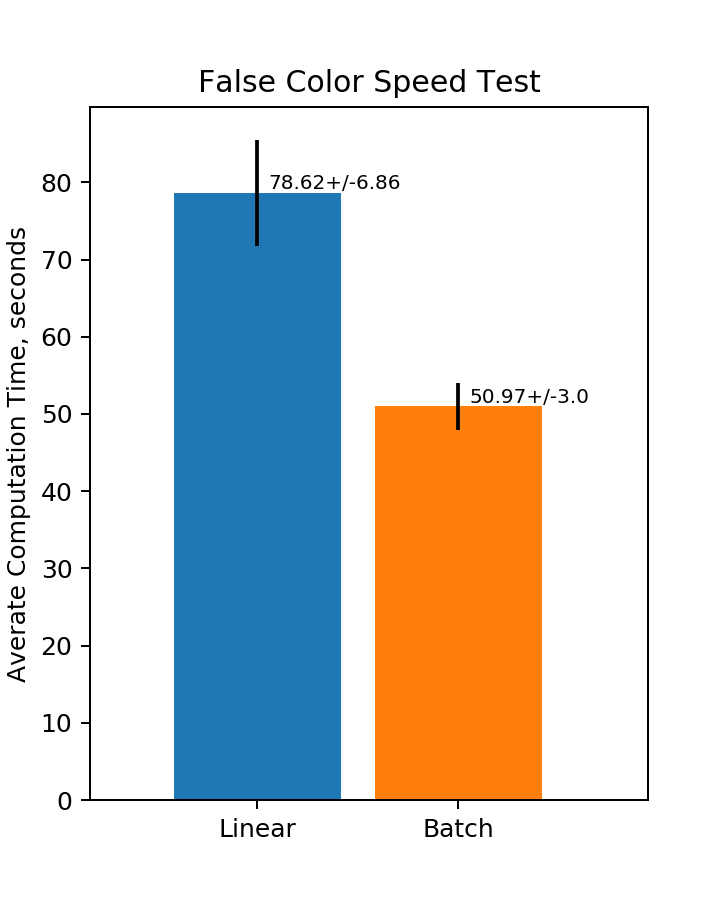

In [80]:
width = 0.15
ind = np.arange(2)

f,ax = plt.subplots(figsize = (4,5))

ax.bar(width,linear_mean,width = width, yerr = linear_std)
ax.text(width + .01,linear_mean+.5,'%s+/-%s' %(round(linear_mean,2),round(linear_std,2)),fontsize = 8)

ax.bar(2*width + .03,batch_mean,width = width,yerr = batch_std)
ax.text(2*width +.04,batch_mean+.5,  '%s+/-%s' %(round(batch_mean,2),round(batch_std,2)),fontsize=8)

ax.set_xticks([width,2*width + .03])
ax.set_xticklabels(['Linear','Batch'])
ax.set_ylabel('Averate Computation Time, seconds')
ax.set_xlim(0,.5)
plt.title('False Color Speed Test')
plt.show()